In [50]:
import math
import cv2
import numpy as np
import matplotlib.pyplot as plt
import PIL
from scipy.signal import windows
from google.colab.patches import cv2_imshow

**cv2.INTER_AREA** - это один из методов интерполяции, используемых функцией **cv2.resize()** в библиотеке OpenCV для изменения размера изображения. Этот метод особенно хорошо подходит для уменьшения размера изображения (даунсемплинга), хотя он также может использоваться и для увеличения, но с меньшей эффективностью, чем другие методы.



**cv2.INTER_AREA** основан на алгоритме усреднения пикселей в области. В отличие от методов, таких как **cv2.INTER_LINEAR** или **cv2.INTER_CUBIC**, которые выполняют интерполяцию на основе значений соседних пикселей, **cv2.INTER_AREA** считает среднее значение пикселей в той области исходного изображения, которая соответствует одному пикселю в уменьшенном изображении.

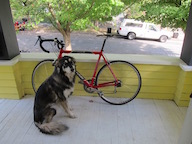

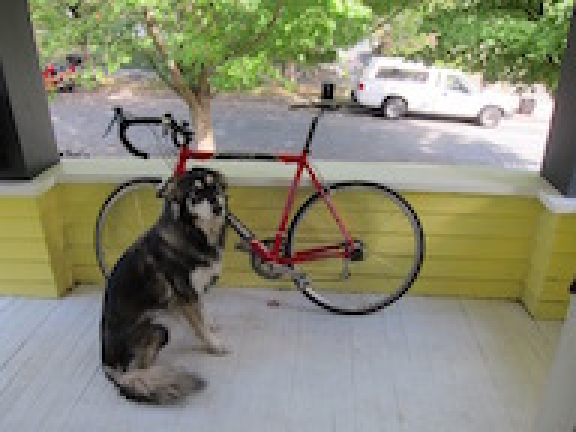

[146 184 184]


In [ ]:
image = cv2.imread("/content/drive/MyDrive/CV_Lab2-main/data/dogsmall.jpg")
# Размер данного изображения (144, 192, 3)

cv2_imshow(image)
image_inter_area = cv2.resize(image, (0, 0), fx=3, fy=3, interpolation=cv2.INTER_AREA)
cv2_imshow(image_inter_area)
print(image_inter_area[55][55])

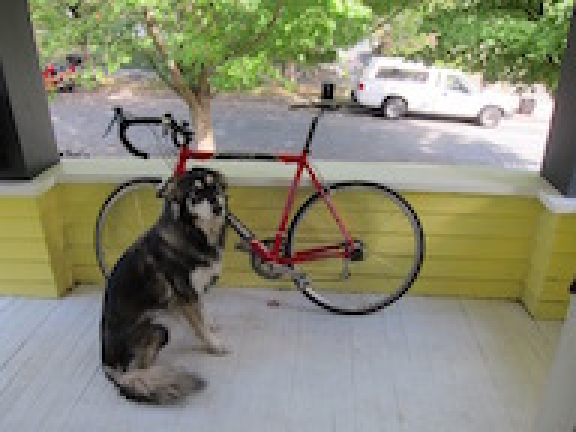

Сравним пиксель с таким же пикселем для изображения с cv2.INTER_AREA -> [146 184 184]


In [ ]:
resize_k_x = 3
resize_k_y = 3
blank_image = np.zeros((image.shape[0] * resize_k_x, image.shape[1]*resize_k_y, image.shape[2]), np.uint8)
for row in range(image.shape[0]):
    for col in range(image.shape[1]):
        blank_image[row*resize_k_x][col*resize_k_y] = image[row][col]
        for res_row in range(resize_k_x):
            for res_col in range(resize_k_y):
                blank_image[row*resize_k_x + res_row][col*resize_k_y + res_col] = image[row][col]

cv2_imshow(blank_image)
print(f"Сравним пиксель с таким же пикселем для изображения с cv2.INTER_AREA -> {blank_image[55][55]}")

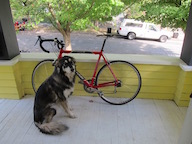

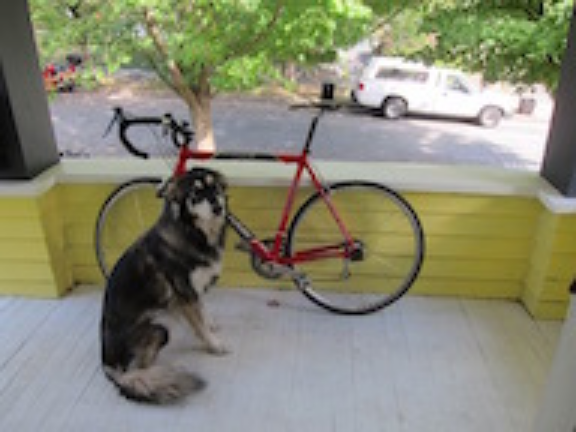

In [ ]:
image_lin_intr = cv2.imread("/content/drive/MyDrive/CV_Lab2-main/data/dogsmall.jpg")

cv2_imshow(image_lin_intr)
image_lin_intr = cv2.resize(image_lin_intr, (0, 0), fx=3, fy=3, interpolation=cv2.INTER_LINEAR)
cv2_imshow(image_lin_intr)

In [ ]:
koef_x = 3
koef_y = 3

height, width = image.shape[:2]
print(height, width)

new_height = int(height * koef_y)
new_width = int(width * koef_x)
print(new_height,new_width)

144 192
432 576


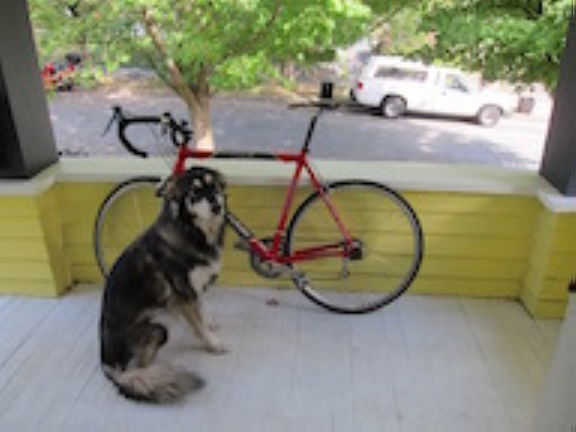

In [ ]:
result = np.zeros((new_height, new_width, image.shape[2]), dtype=image.dtype)

for y in range(new_height):
    for x in range(new_width):
      # Вычислим координаты в исходном изображении (float)
      original_y = y / koef_y
      original_x = x / koef_x

      # Выберем целочисленные части координат
      y_low = math.floor(original_y)
      x_low = math.floor(original_x)

      # Выберем дробные части координат (для весов)
      y_frac = original_y - y_low
      x_frac = original_x - x_low

      # для граничных случаев
      y_low = max(0, min(y_low, height - 2))
      x_low = max(0, min(x_low, width - 2))

      y_high = min(height - 1, y_low + 1)
      x_high = min(width - 1, x_low + 1)

      for c in range(image.shape[2]):
        val_low = image[y_low, x_low, c]
        val_high = image[y_high, x_low, c]
        val_low2 = image[y_low, x_high, c]
        val_high2 = image[y_high, x_high, c]

        result[y,x,c] = (1-y_frac)*(1-x_frac)*val_low+ \
                        (y_frac)*(1-x_frac)*val_high+ \
                        (1-y_frac)*(x_frac)*val_low2+ \
                        (y_frac)*(x_frac)*val_high2
cv2_imshow(result)

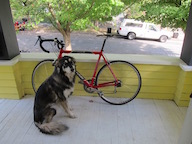

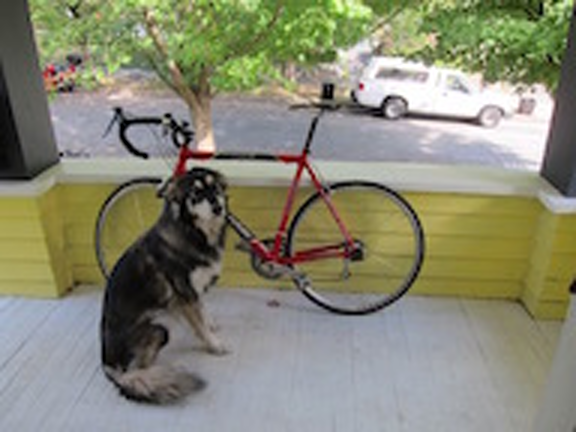

In [ ]:
image_cubic_intr = cv2.imread("/content/drive/MyDrive/CV_Lab2-main/data/dogsmall.jpg")

cv2_imshow(image_cubic_intr)
image_cubic_intr = cv2.resize(image_cubic_intr, (0, 0), fx=3, fy=3, interpolation=cv2.INTER_CUBIC)
cv2_imshow(image_cubic_intr)



---


**Применение фильтров**

---



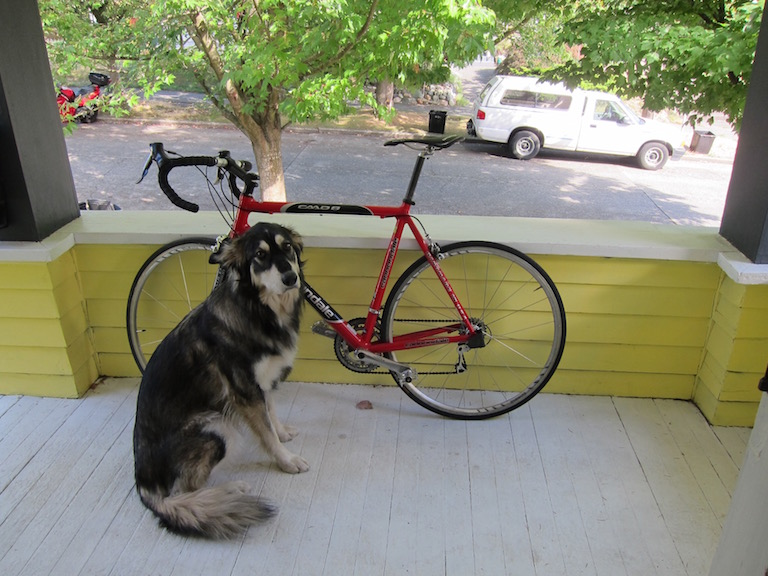

In [24]:
img = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg')
#img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
cv2_imshow(img)

**Двумерный фильтр размытия, усредняющий значения пикселей**

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


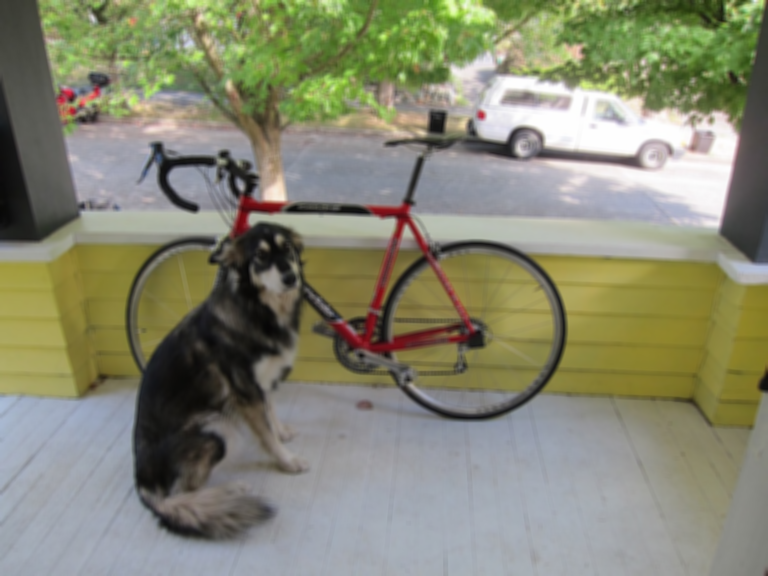

In [25]:
kernel1 = np.ones((5,5), np.float32)/25
print(kernel1)
img = cv2.filter2D(src=img, ddepth=-1, kernel=kernel1)
cv2_imshow(img)

(576, 768, 3)
(580, 772, 3)


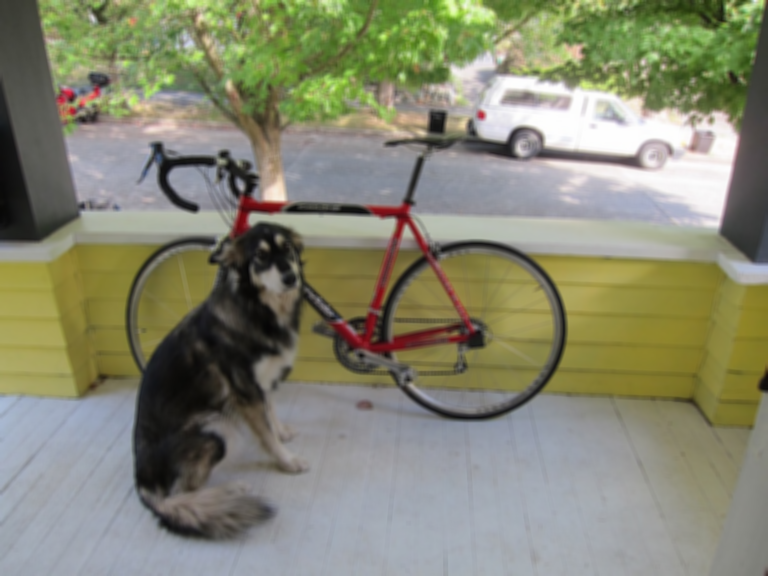

In [30]:
img = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg')
print(img.shape)
kernel = np.ones((5,5), np.float32)/25

height, width, channels = img.shape
kernel_height, kernel_width = kernel.shape
pad_height = kernel_height // 2
pad_width  = kernel_width // 2

# Создаем паддинг
padded_image = np.pad(img, ((pad_height, pad_height), (pad_width, pad_width), (0,0)), mode='reflect')
print(padded_image.shape)
output_image = np.zeros_like(img, dtype=np.float32)

for y in range(height):
    for x in range(width):
        for c in range(channels):
            region = padded_image[y:y + kernel_height, x:x + kernel_width, c]

            output_image[y, x, c] = np.sum(region * kernel)

cv2_imshow(output_image)

**Фильтр Гауса**


1.   Уменьшает уровень шумов
2.   Сглаживает изображение
3.   Не лучший выбор для высокочастотных шумов






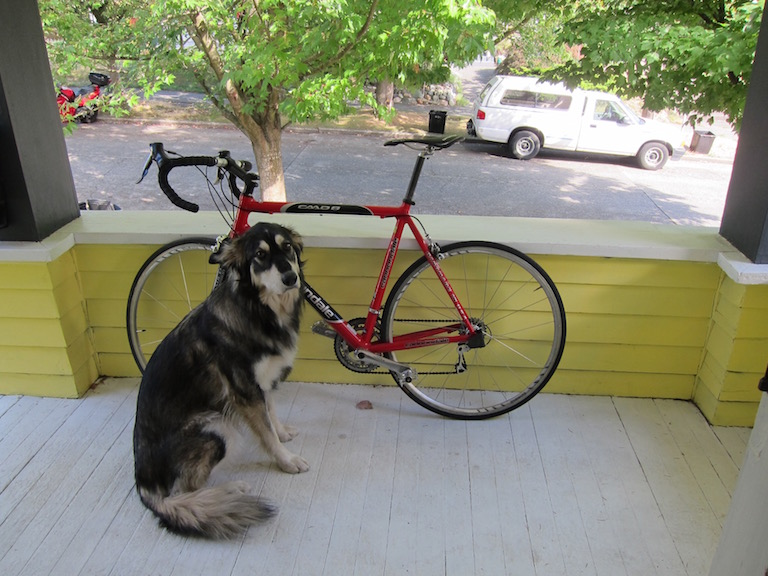

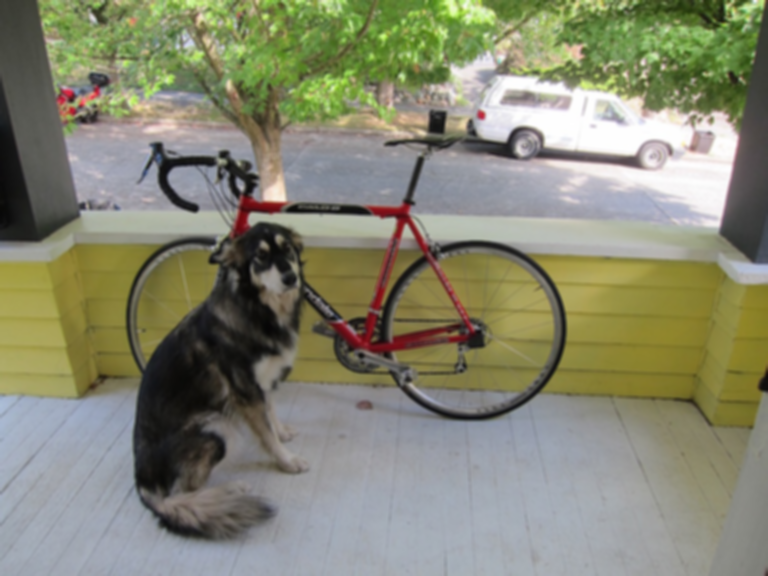

In [38]:
image = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg')
cv2_imshow(image)

blurred_image = cv2.GaussianBlur(image, (5, 5), sigmaX=1.5)
cv2_imshow(blurred_image)

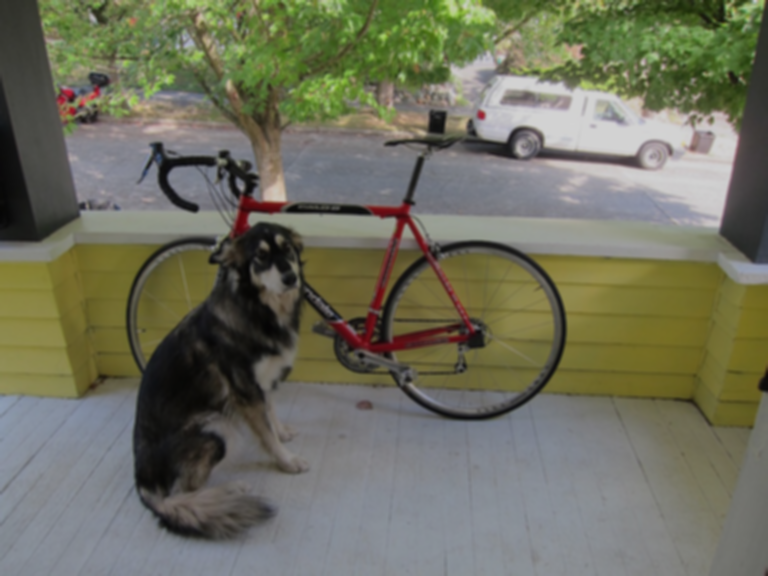

In [41]:
def gaussian_kernel(size, sigma):
  center = size // 2
  x, y = np.mgrid[0 - center : size - center, 0 - center : size - center]
  g = 1/(2*np.pi*sigma**2) * np.exp(-(x**2+y**2)/(2*sigma**2))
  return g

image = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg')

kernel = gaussian_kernel(5, 1.5)
height, width, channels = image.shape
k_height, k_width = kernel.shape

pad_height, pad_width = k_height // 2, k_width // 2
padded_image = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width), (0,0)), mode='reflect')
output = np.zeros_like(image, dtype = np.float32)

for y in range(height):
    for x in range(width):
        for c in range(channels):
            region = padded_image[y: y + k_height, x: x + k_width, c]
            output[y, x, c] = np.sum(region * kernel)
cv2_imshow(output)

**Медианный фильтр**
С помощью окна усреднения (медианы)
1.   Уменьшает уровень высокочастотных шумов
2.   Сохраняет границы
3.   Долго работает(((

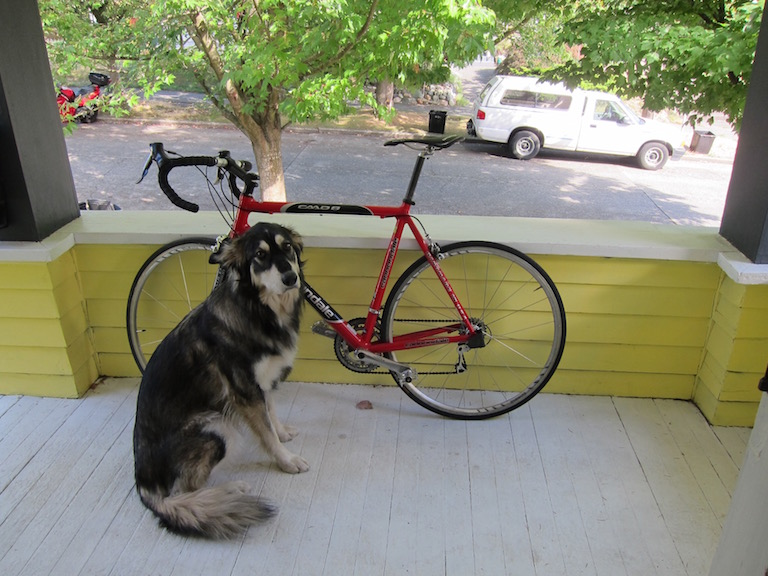

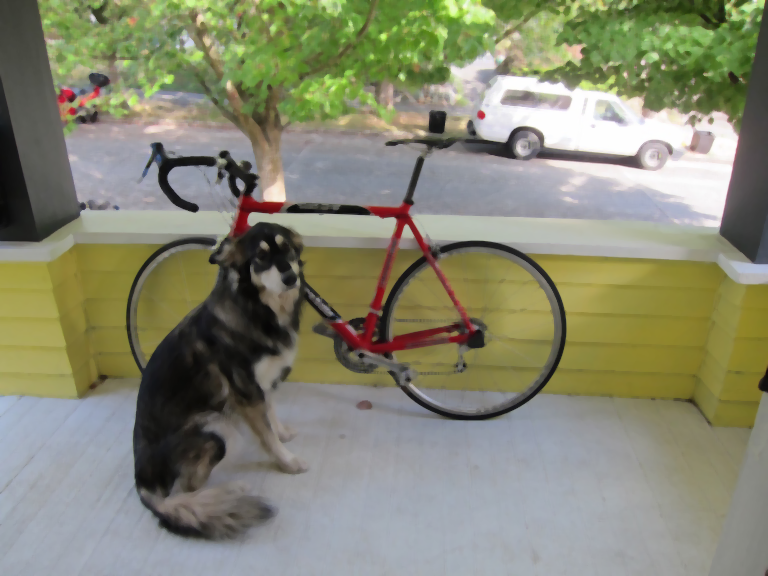

In [39]:
image = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg')
cv2_imshow(image)

blurred_image = cv2.medianBlur(image, ksize=5)
cv2_imshow(blurred_image)

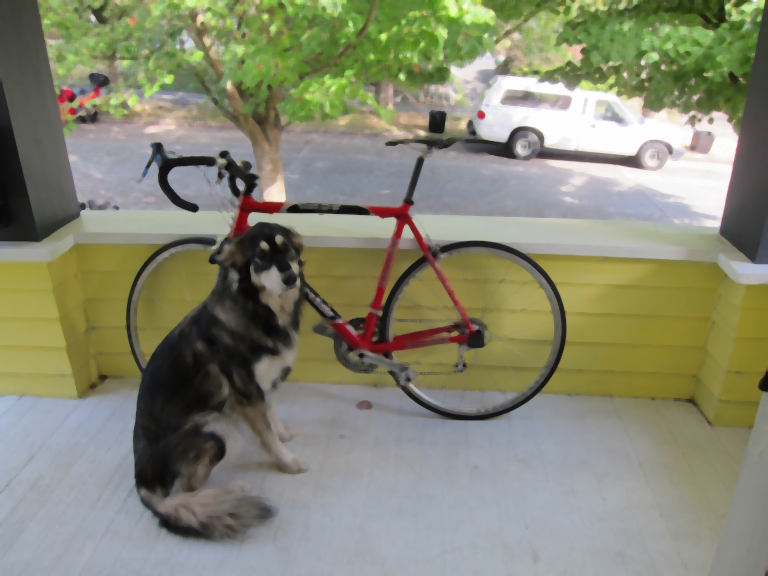

In [42]:
image = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg')
ksize = 5

height, width, channels = image.shape
pad_size = ksize // 2
padded_image = np.pad(image, ((pad_size,pad_size),(pad_size,pad_size),(0,0)), mode = 'reflect')

output = np.zeros_like(image, dtype=image.dtype)

for y in range(height):
    for x in range(width):
        for c in range(channels):
            region = padded_image[y: y+ksize, x: x+ksize, c]
            output[y, x, c] = np.median(region)
cv2_imshow(output)

**Билатеральный фильтр**

1.   Уменьшает влияние далеко стоящих пикселей
2.   Выкидывает пиксели выбросы из усреднения


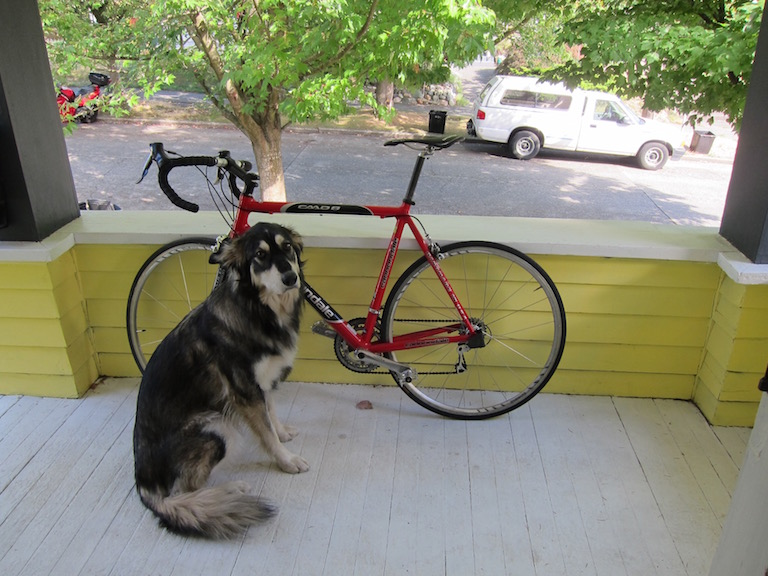

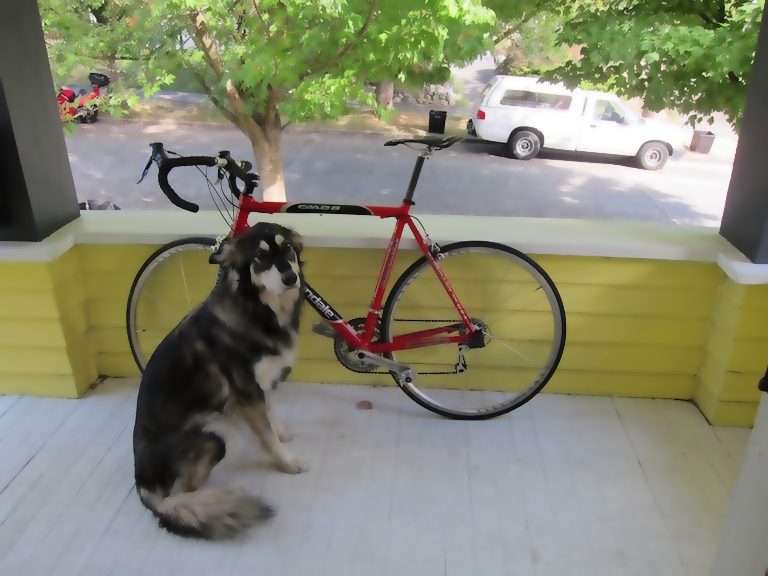

In [40]:
image = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg')
cv2_imshow(image)

blurred_image = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)
cv2_imshow(blurred_image)

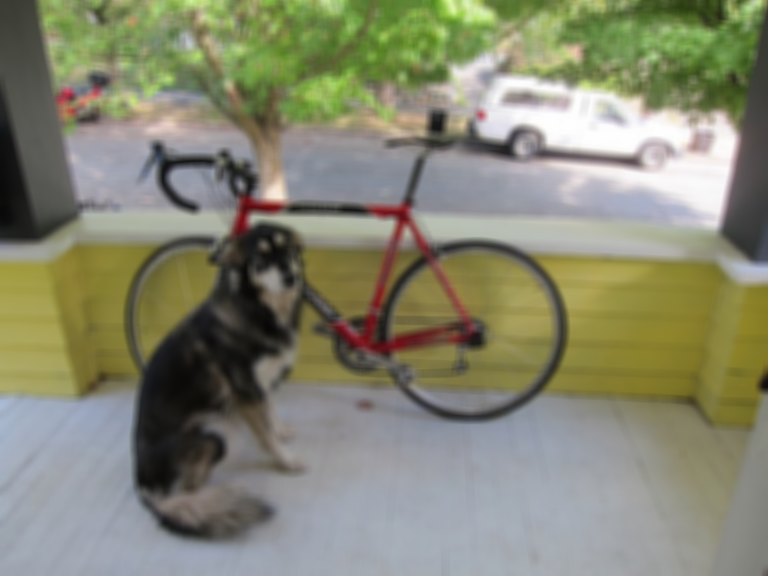

In [44]:
image = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg')

def gaussian(x, sigma):
    return (1 / (math.sqrt(2*np.pi) * sigma)) * np.exp(-x**2 / (2 * sigma**2))

diameter = 9
sigma_color = 75
sigma_space = 75

height, width, channels = image.shape
pad_size = diameter // 2
padded_image = np.pad(image, ((pad_size, pad_size), (pad_size, pad_size), (0,0)), mode='reflect')
output = np.zeros_like(image, dtype=np.float32)

for y in range(height):
    for x in range(width):
        for c in range(channels):
            weighted_sum = 0
            total_weight = 0
            for ky in range(-pad_size, pad_size + 1):
                for kx in range(-pad_size, pad_size + 1):
                    ny, nx = y+ky, x+kx
                    if ny>=0 and ny < height and nx >= 0 and nx < width:
                      distance = math.sqrt(ky**2 + kx**2)
                      space_weight = gaussian(distance, sigma_space)
                      color_difference = np.sum((padded_image[y+pad_size, x+pad_size, :] - padded_image[ny + pad_size, nx + pad_size, :])**2)
                      color_weight = gaussian(math.sqrt(color_difference), sigma_color)
                      weight = space_weight * color_weight
                      weighted_sum += weight * padded_image[ny + pad_size, nx + pad_size, c]
                      total_weight += weight
            output[y,x,c] = weighted_sum / total_weight
cv2_imshow(output)

**Фильтры Собеля**

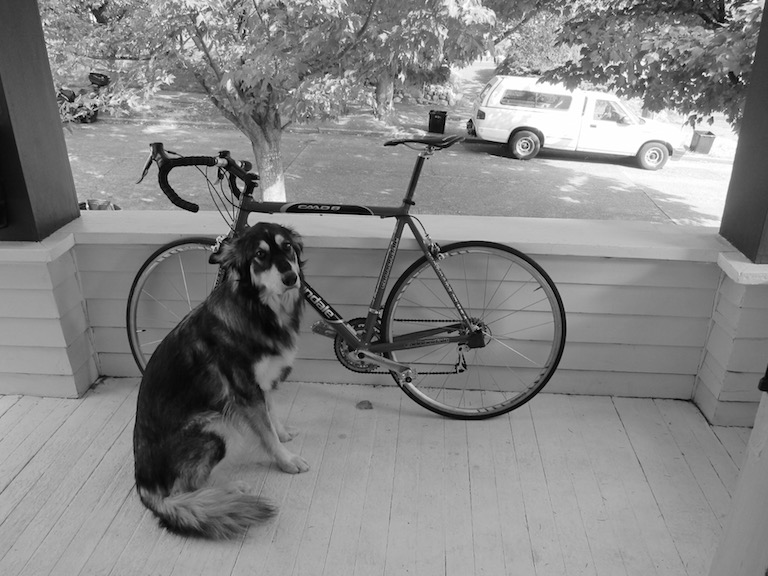

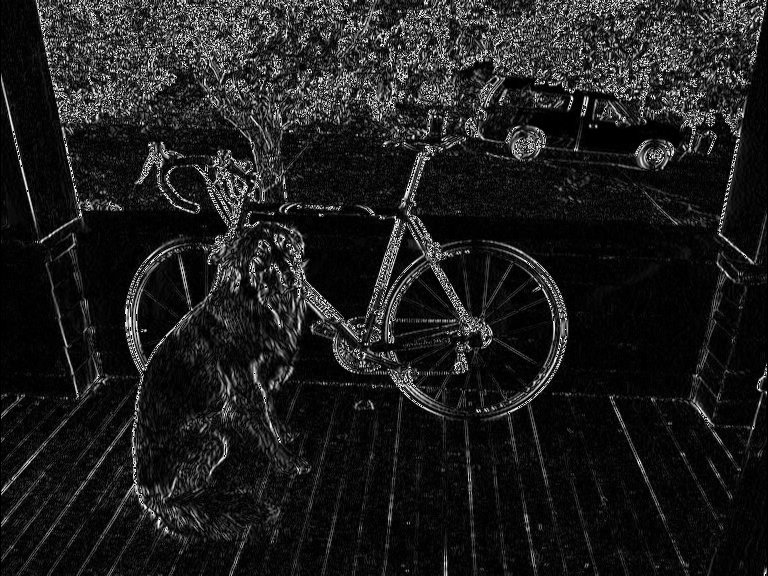

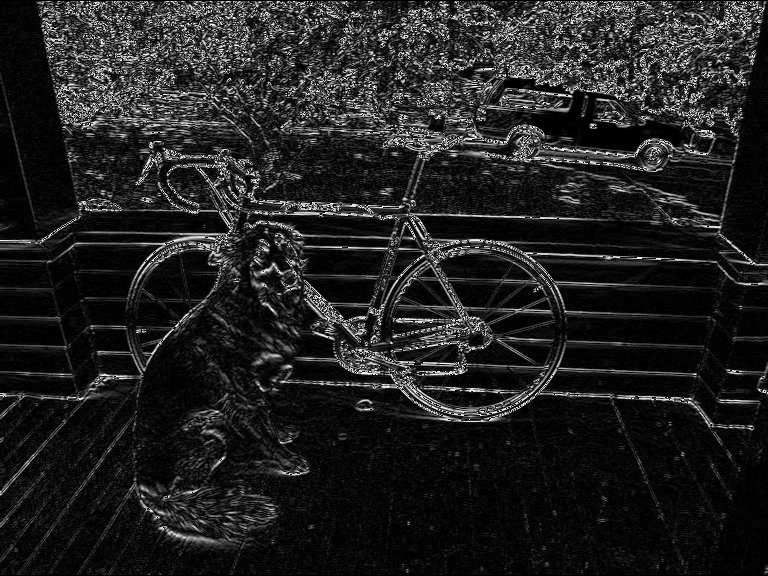

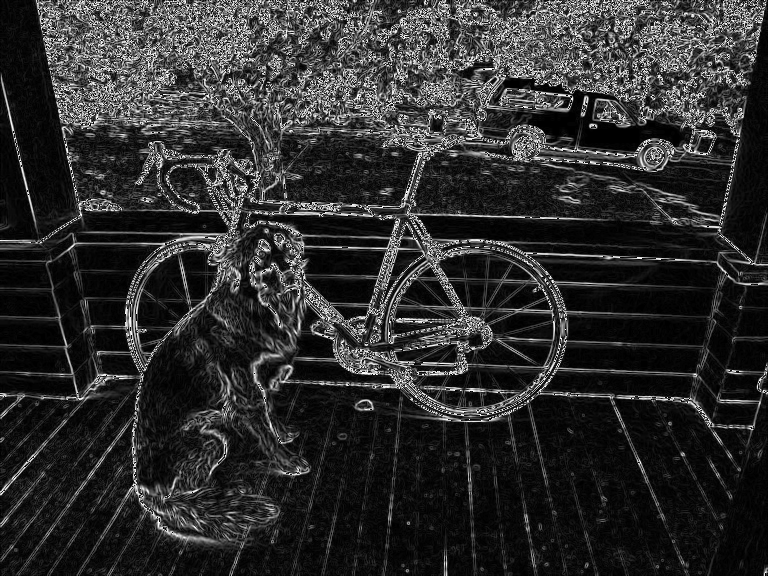

In [49]:
image = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg', cv2.IMREAD_GRAYSCALE)
ksize = 3

grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=ksize)
grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=ksize)
grad_magnitude = np.sqrt(grad_x**2 + grad_y**2)

cv2_imshow(image)
cv2_imshow(np.abs(grad_x).astype(np.uint8))
cv2_imshow(np.abs(grad_y).astype(np.uint8))
cv2_imshow(grad_magnitude.astype(np.uint8))

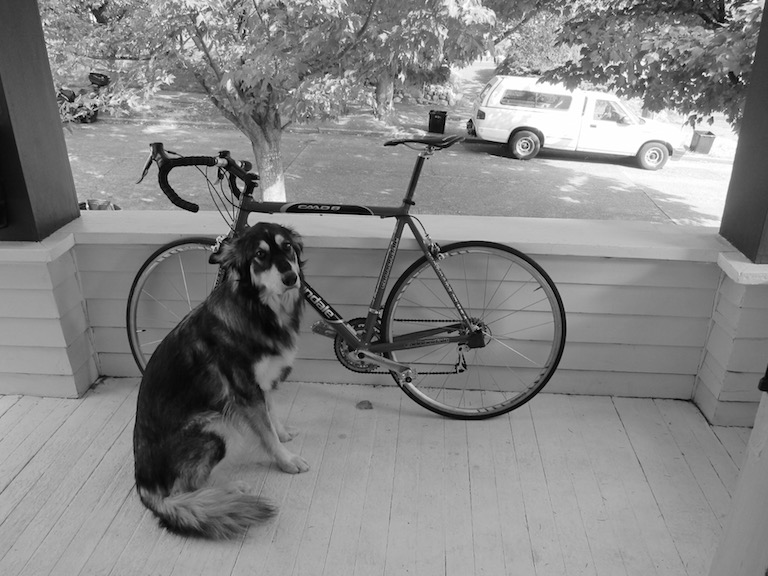

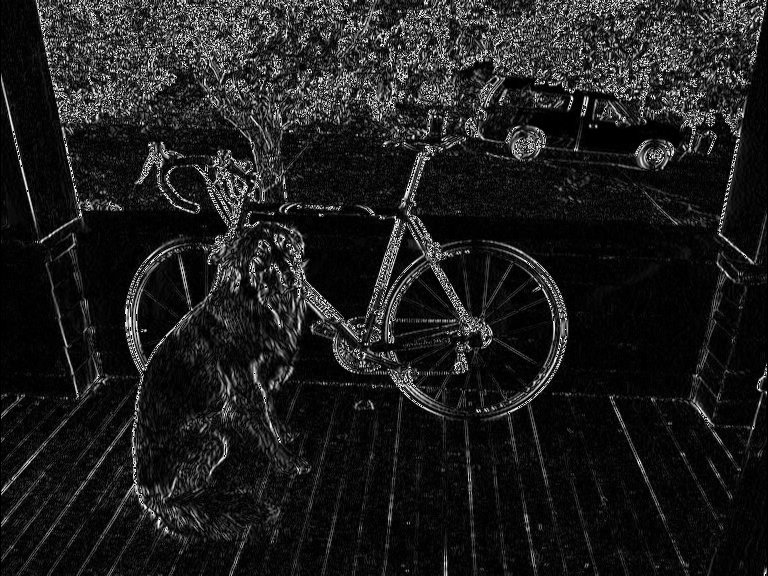

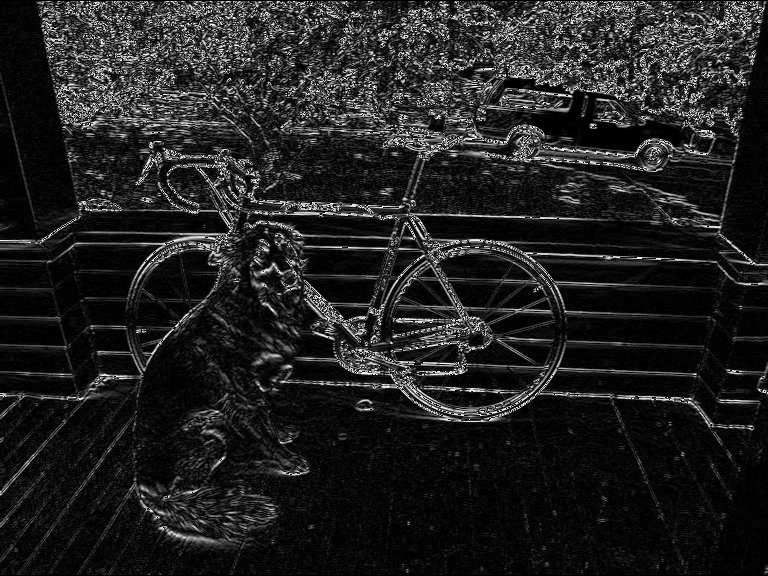

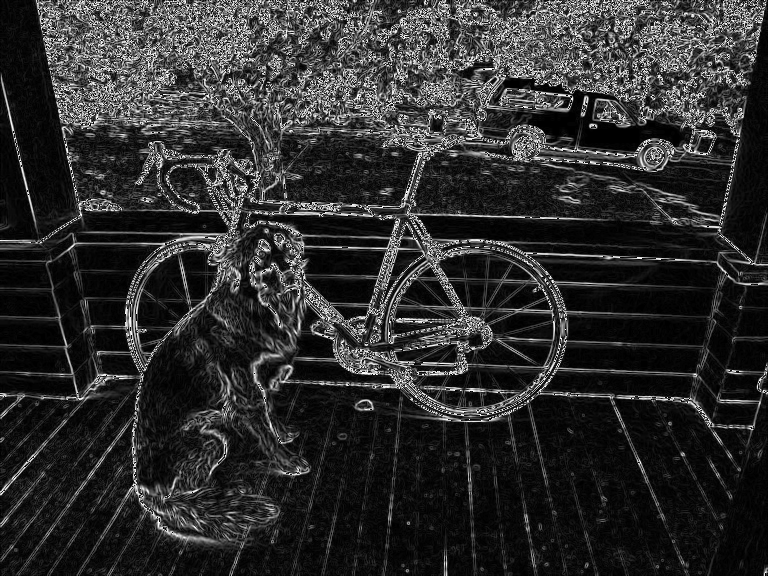

In [46]:
image = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg', cv2.IMREAD_GRAYSCALE)
ksize = 3

def convolution2d(image, kernel):
   height, width = image.shape
   k_height, k_width = kernel.shape
   pad_height, pad_width = k_height // 2, k_width // 2
   padded_image = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode = 'reflect')

   output = np.zeros_like(image, dtype = np.float32)
   for y in range(height):
        for x in range(width):
           region = padded_image[y:y+k_height, x:x+k_width]
           output[y,x] = np.sum(region * kernel)
   return output



kernel_x = np.array([[-1, 0, 1],
                     [-2, 0, 2],
                     [-1, 0, 1]], dtype=np.float32)
kernel_y = np.array([[-1, -2, -1],
                     [0, 0, 0],
                     [1, 2, 1]], dtype=np.float32)


grad_x = convolution2d(image, kernel_x)
grad_y = convolution2d(image, kernel_y)
grad_magnitude = np.sqrt(grad_x**2 + grad_y**2)


cv2_imshow(image)
cv2_imshow(np.abs(grad_x).astype(np.uint8))
cv2_imshow(np.abs(grad_y).astype(np.uint8))
cv2_imshow(grad_magnitude.astype(np.uint8))

**Карта пространственой частоты изображения**

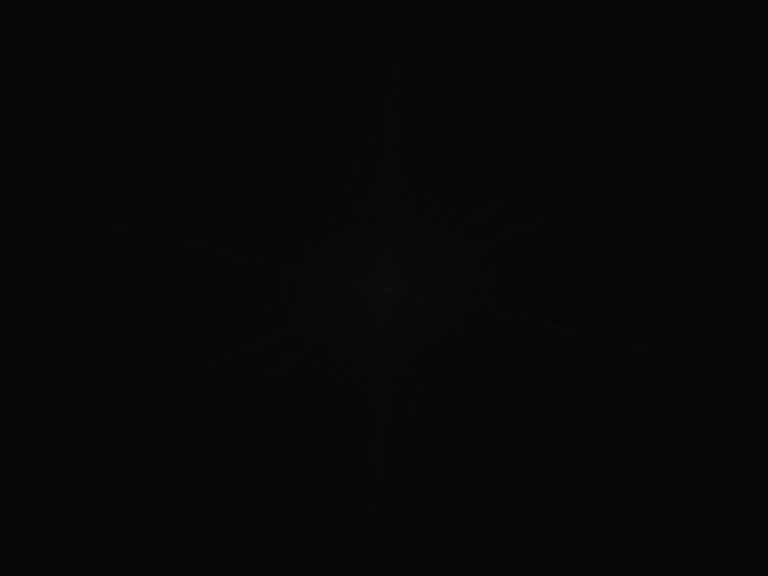

In [52]:
image = cv2.imread('/content/drive/MyDrive/CV_Lab2-main/data/dog.jpg')

gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
rows, cols = gray_img.shape

window_row = windows.hann(rows)
window_col = windows.hann(cols)
window_2d = np.outer(window_row, window_col)
windowed_img = gray_img * window_2d

dft = cv2.dft(np.float32(windowed_img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
magnitude_spectrum = cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1])
spatial_frequency_map = np.log1p(magnitude_spectrum)



cv2_imshow(spatial_frequency_map)

# for k in range(image.shape[0]):
#     for l in range(image.shape[1]):
#         res = 0
#         for i in range(image.shape[0]):
#             for j in range(image.shape[1]):
#                 res += image[i][j] * np.exp(-1j * 2 * np.pi * (k*i/image.shape[0] + l*j/image.shape[1]))
#         blank_image[k][l] = res